# Colormap Operator

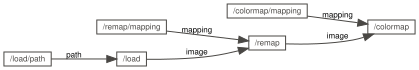

INFO:imagecat.operator:Task /load load:
INFO:imagecat.operator:  layers: *
INFO:imagecat.operator:  path: Wood048_2K_Color.jpg
INFO:imagecat.operator:  output: Image(C: Layer(Role.RGB 2048x2048x3 float16))
INFO:imagecat.operator:Task Y remap:
INFO:imagecat.operator:  mapping: {'Y': {'selection': [('C', 0)], 'role': <Role.LUMINANCE: 10>}}
INFO:imagecat.operator:  output: Image(Y: Layer(Role.LUMINANCE 2048x2048x1 float16))


In [1]:
import functools
import logging
logging.basicConfig(level=logging.INFO)

import graphcat.notebook
import imagecat.color.brewer
import imagecat.notebook

mapping = functools.partial(imagecat.color.linear_map, palette=imagecat.color.brewer.palette("BlueRed"))

graph = graphcat.StaticGraph()
imagecat.add_task(graph, "/load", imagecat.operator.load, path="Wood048_2K_Color.jpg")
imagecat.add_task(graph, "/remap", imagecat.operator.remap, mapping={"Y": {"selection": [("C", 0)], "role": imagecat.data.Role.LUMINANCE}})
imagecat.add_task(graph, "/colormap", imagecat.operator.color.colormap, mapping=mapping)
imagecat.add_links(graph, "/load", ("/remap", "image"))
imagecat.add_links(graph, "/remap", ("/colormap", "image"))


graphcat.notebook.display(graph)
image = graph.output("/remap")

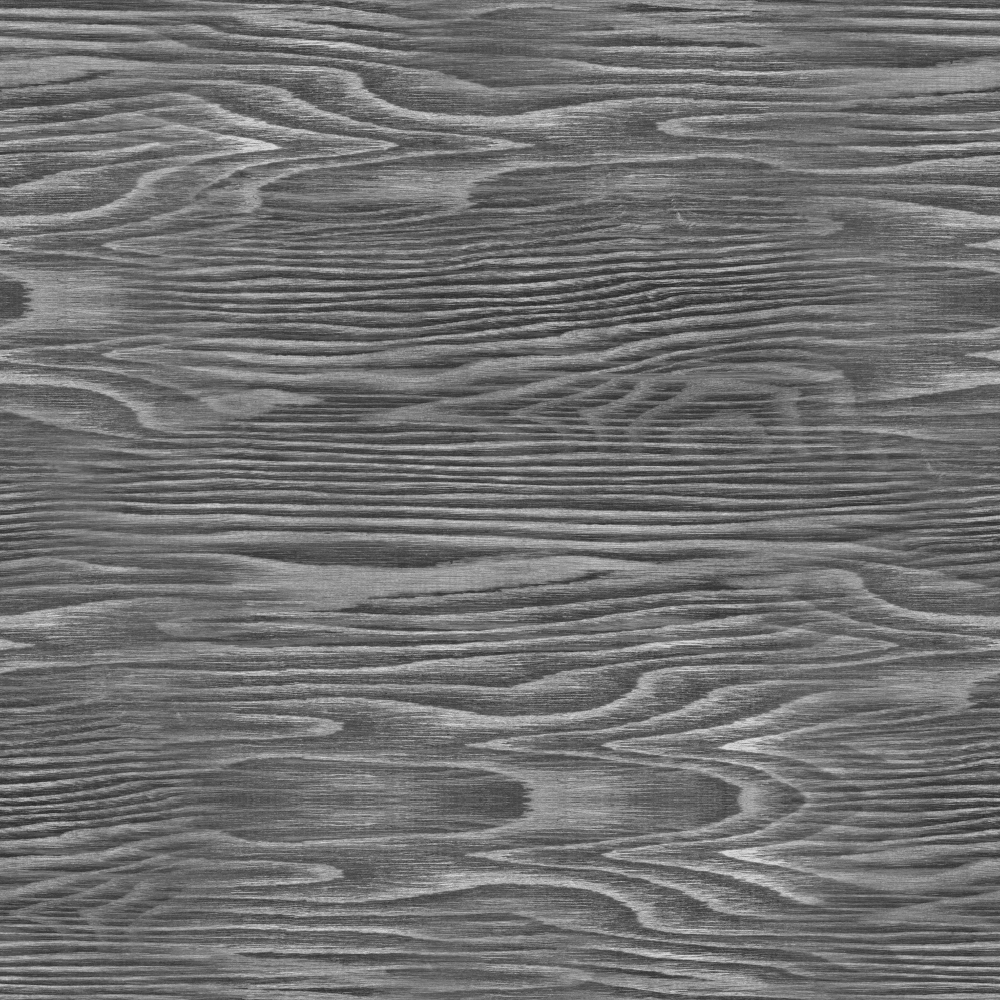

In [2]:
image.layers["Y"]

In [3]:
image = graph.output("/colormap")

INFO:imagecat.operator.color:Task /colormap colormap:
INFO:imagecat.operator.color:  inlayer: None
INFO:imagecat.operator.color:  mapping: functools.partial(<function linear_map at 0x7f97856d57a0>, palette=<imagecat.color.Palette object at 0x7f9784381d90>)
INFO:imagecat.operator.color:  outlayer: C
INFO:imagecat.operator.color:  output: Image(C: Layer(Role.RGB 2048x2048x3 float64))


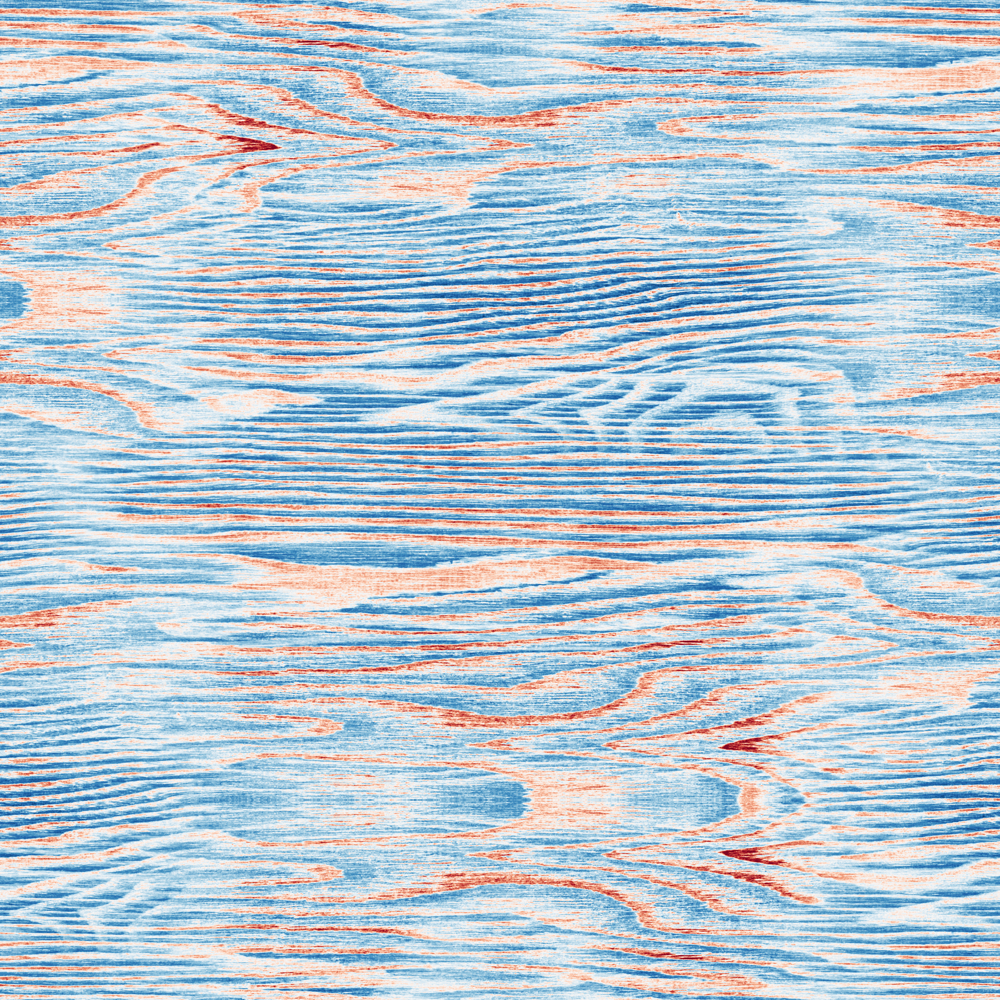

In [4]:
image.layers["C"]